In [14]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pickle
import scipy

In [2]:
smoothing_param = 5

In [3]:
output_dir = f'/home/earthquakes1/homes/Rebecca/phd/stf/figures/large_scale_peaks_all/'
file_path = f'{output_dir}kurtosis_skew.csv'
columns = ['event', 'scardec_opt_kurtosis', 'scardec_opt_skew', 'scardec_moy_kurtosis', 'scardec_moy_skew', 'ye_kurtosis', 'ye_skew', 'usgs_kurtosis', 'usgs_skew', 'sigloch_0_kurtosis', 'sigloch_0_skew', 'sigloch_1_kurtosis', 'sigloch_1_skew', 'isc_kurtosis', 'isc_skew']
df = pd.read_csv(file_path, header=None, names=columns)#, header=None)
#df['int_magnitude'] = df['magnitude'].astype(int)

In [4]:
smoothing_param = 10000

In [5]:
def get_scardec_stf(scardec_name, wanted_type = 'fctopt'):
    time = []
    momentrate = []

    event = os.listdir(f'/home/earthquakes1/homes/Rebecca/phd/stf/data/scardec/{scardec_name}')
    starts = [n for n, l in enumerate(event) if l.startswith(wanted_type)]
    with open(f'/home/earthquakes1/homes/Rebecca/phd/stf/data/scardec/{scardec_name}/{event[starts[0]]}') as f:
        lines = f.read().splitlines()

    lines = lines[2:]
    for line in lines:
        split = line.split(' ')
        split = [s for s in split if s not in ['', ' ', '\n']]
        time.append(float(split[0]))
        momentrate.append(float(split[1]))

    momentrate = np.array(momentrate)
    time = np.array(time)
    return momentrate, time

In [6]:
def get_ye_stf(ye_name):
    data_path = '/home/earthquakes1/homes/Rebecca/phd/stf/data/Ye_et_al_2016/'
    momentrate = []
    time = []

    with open(data_path + str(ye_name), 'r') as f:
        data = f.readlines()
        for line in data:
            line = line.strip()
            line = line.rstrip()
            if line[0] not in ['0','1','2','3','4','5','6','7','8','9']:
                continue
            line = line.split()
            time.append(float(line[0]))
            momentrate.append(float(line[1]))
    momentrate = np.array(momentrate)
    time = np.array(time)
    return momentrate, time

In [7]:
def get_usgs_stf(usgs_name):
    data_path = '/home/earthquakes1/homes/Rebecca/phd/stf/data/USGS/'
    momentrate = []
    time = []

    with open(data_path + str(usgs_name), 'r') as f:
        data = f.readlines()
        for line in data:
            line = line.strip()
            line = line.rstrip()
            if line[0] not in ['0','1','2','3','4','5','6','7','8','9']:
                continue
            line = line.split()
            time.append(float(line[0]))
            momentrate.append(float(line[1]))

    momentrate = np.array(momentrate)
    time = np.array(time)

    momentrate = momentrate / 10**7 # convert to Nm from dyne cm
    return momentrate, time

In [8]:
def get_sigloch_stf(sigloch_name):
    data_path = '/home/siglochnas1/shared/AmplitudeProjects/pdata_processed/psdata_events/'
    momentrate = []
    time = []

    file_path = data_path + str(sigloch_name) + '/outfiles/ampinv.stf.xy'

    with open(file_path, 'r') as file:
        content = file.read()
        content = content.split('\n')
        greater_than_count = content.count('>')
        if greater_than_count > 0:
            time = [list(np.arange(0, 25.6, 0.1))]
            momentrate = [[]]
            for i in range(greater_than_count-1):
                time.append(list(np.arange(0, 25.6, 0.1)))
                momentrate.append([])


        stf_count = 0
        for c in content:
            if c not in ['<', '>', '']:
                split = c.split()
                #time[stf_count].append(float(split[0]))
                momentrate[stf_count].append(10**float(split[1]))
            else:
                stf_count += 1

    # time = np.arange(0, 25.6, 0.1)
    # time = np.array(time)
    return momentrate, time

In [9]:
def get_isc_stf(isc_name):
    isc_save_path = '/home/earthquakes1/homes/Rebecca/phd/stf/data/isc/'
    with open(f'{isc_save_path}{isc_name}/{isc_name}.txt', 'rb') as f:
        stf_list = pickle.load(f)
    with open(f'{isc_save_path}{isc_name}/{isc_name}_norm_info.txt', 'rb') as f:
        norm_dict = pickle.load(f)

    time = np.arange(0, 25.6, 0.1)
    momentrate = np.array(stf_list)*norm_dict['mo_norm']*10**8,
    #print(momentrate)
    return momentrate[0], time

In [10]:
combined = pd.read_csv('/home/earthquakes1/homes/Rebecca/phd/stf/data/combined_scardec_ye_usgs_sigloch_isc_mag.csv')

In [11]:
combined.columns = ['event', 'scardec', 'ye', 'isc', 'sigloch', 'usgs', 'mag']

In [12]:
def find_end_stf(momentrate, time, dataset = ''):
    not_zero = np.where(momentrate > 0)[0]
    #print(max(momentrate))
    start = min(not_zero)
    end = max(not_zero)

    detected_end = end
    detected_end_time = time[end]

    time = time[:end]
    momentrate = momentrate[:end]

    less_than_10 = np.where(momentrate <= 10*max(momentrate)/100)[0]

    if dataset == 'sigloch':
        start = np.where(momentrate > 0.05 * max(momentrate))[0][0]
    else:
        start = min(not_zero)
    #print(less_than_10)
    total_moment = scipy.integrate.simpson(momentrate[start:end],
                                        dx = time[1]-time[0])
    #print(less_than_10)
    for i in less_than_10:
        if i <= start:
            continue
        if i == 0:
            continue
        moment = scipy.integrate.simpson(momentrate[start:i],
                                        dx = time[1]-time[0])
        #print(i, moment/total_moment)
        if moment >= 0.5 * total_moment:
            #print('inif')
            #print(f'first time where < 10% of total momentrate and 50% of moment released: {time[i]} s')
            detected_end_time = time[i]
            detected_end = i
            #print(f'proportion of moment released: {(moment/total_moment)*100:.2f}%')
            break
    return detected_end_time, detected_end, time[start], start
    #return time[end], end

In [15]:
to_ignore = ['20051203_1610_1', '20071226_2204_2', '20030122_0206_1', '20090929_1748_0', '20120421_0125_1', '20110311_2011_2']

columns_to_save = ['event', 'dataset', 'mag', 'interp_momentrate']
df_interp = pd.DataFrame(columns = columns_to_save)
max_len = 0
peaks_dict = {}
count_datasets = {}

output_dir = '/home/earthquakes1/homes/Rebecca/phd/stf/figures/large_scale_peaks_all/'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

columns = ['event', 'scardec_opt_max_timing',  'scardec_moy_max_timing', 'ye_max_timing', 'usgs_max_timing', 'sigloch_0_max_timing', 'sigloch_1_max_timing', 'isc_max_timing']


for i, row in combined.iterrows():
	# if i < 360:
	# 	continue

	#fig, axs = plt.subplots(2, 1, figsize=(10, 10))

	event_dict = {}
	for dataset, get_stf in zip(['scardec_opt', 'scardec_moy', 'ye', 'usgs', 'sigloch', 'isc'], [get_scardec_stf, get_scardec_stf, get_ye_stf, get_usgs_stf, get_sigloch_stf, get_isc_stf]):

		if dataset == 'scardec_moy' or dataset == 'scardec_opt':
			name = row[dataset[:-4]]
		else:
			name = row[dataset]

		if name == '0' or name == 0:
			continue

		if dataset == 'scardec_moy':
			momentrate, time = get_stf(name, 'fctmoy')
		elif dataset == 'scardec_opt':
			momentrate, time = get_stf(name, 'fctopt')
		else:
			momentrate, time = get_stf(name)

		if dataset != 'sigloch':
			momentrate_list = [momentrate]
			time_list = [time]
		else:
			momentrate_list = momentrate
			time_list = time

		count = 0
		sigloch_count = 0
		for momentrate, time in zip(momentrate_list, time_list):
			if time[0] == time[1]:
				time = time[1:]

			if dataset != 'sigloch':
				save_key = row.event
				dataset_name = dataset
			else:
				dataset_name = dataset + '_' + str(count)
				save_key = row.event + '_' + str(count)

			if save_key in to_ignore:
				continue
			#print(time[0:10])
			
			momentrate = np.array(momentrate)

			if dataset == 'sigloch':
				#momentrate = 10**momentrate
				#momentrate_sigloch = momentrate.copy()
				#file.write(f'Processing {dataset}_{sigloch_count}\n')
				name_to_save = f'{dataset}_{sigloch_count}'
				# print(name_to_save)
				# print(momentrate[0])
			else:
				#file.write(f'Processing {dataset}\n')
				name_to_save = dataset

			time = np.array(time)
			detected_end_time, detected_end, detected_start_time, detected_start = find_end_stf(momentrate, time, dataset)
			if dataset == 'sigloch':
				print(momentrate)
				print(row.event)
				print(detected_start_time, detected_start)
				print(detected_end_time, detected_end)
			time = time[detected_start:detected_end] # shift to start STF at zero
			time = time - time[0]
			momentrate = momentrate[detected_start:detected_end]
			max_len = max(max_len, len(momentrate))
			norm_momentrate = momentrate / max(momentrate)
			norm_time = time / max(time)
			#axs[0].plot(norm_time, norm_momentrate)

			interp_momentrate = np.interp(np.linspace(0, 1, 10000), norm_time, norm_momentrate)
			interp_momentrate[interp_momentrate < 0] = 0

			#axs[1].plot(np.linspace(0, 1, 100), interp_momentrate)

			df_interp = pd.concat([df_interp, pd.DataFrame([[row.event, dataset_name, row.mag, interp_momentrate]], columns = columns_to_save)], ignore_index = True)


/tmp/ipykernel_1185772/4243598183.py:97: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_interp = pd.concat([df_interp, pd.DataFrame([[row.event, dataset_name, row.mag, interp_momentrate]], columns = columns_to_save)], ignore_index = True)


[2.79894136e+15 2.79895361e+15 3.51332398e+15 4.27446042e+15
 5.03958181e+15 5.75366935e+15 6.36268466e+15 6.81935187e+15
 7.09292389e+15 7.17554678e+15 7.08515572e+15 6.86546409e+15
 6.56540770e+15 6.23053156e+15 5.88548287e+15 5.53408468e+15
 5.16551706e+15 4.76709822e+15 4.33634772e+15 3.88153584e+15
 3.42117193e+15 2.97509748e+15 2.55991238e+15 2.18791628e+15
 1.86818336e+15 1.60746491e+15 1.40878202e+15 1.27259877e+15
 1.19776881e+15 1.18319983e+15 1.23029625e+15 1.34471020e+15
 1.53764896e+15 1.82647150e+15 2.23443538e+15 2.78889202e+15
 3.51622615e+15 4.43042409e+15 5.51023220e+15 6.67394772e+15
 7.76970804e+15 8.60733686e+15 9.03751435e+15 9.03068929e+15
 8.68834785e+15 8.17918818e+15 7.66144521e+15 7.23686548e+15
 6.95102099e+15 6.81498023e+15 6.82699367e+15 6.98945479e+15
 7.31971716e+15 7.85855686e+15 8.67951784e+15 9.89434615e+15
 1.16565572e+16 1.41654345e+16 1.76598252e+16 2.23831034e+16
 2.85126839e+16 3.60737923e+16 4.49146066e+16 5.47081967e+16
 6.50163523e+16 7.531815

In [16]:
combined = pd.read_csv('/home/earthquakes1/homes/Rebecca/phd/stf/data/combined_scardec_ye_usgs_sigloch_isc_mag.csv')


In [17]:
df.drop(columns=['event'], inplace=True)

In [18]:
df.index.name = 'event'
df.reset_index(inplace=True)
#df.drop(columns=['event'], inplace=True)

In [47]:
columns = ['event', 'scardec_opt_kurtosis', 'scardec_opt_skew', 'scardec_moy_kurtosis', 'scardec_moy_skew', 'ye_kurtosis', 'ye_skew', 'usgs_kurtosis', 'usgs_skew', 'sigloch_0_kurtosis', 'sigloch_0_skew', 'sigloch_1_kurtosis', 'sigloch_1_skew', 'isc_kurtosis', 'isc_skew']
output_dir = '/home/earthquakes1/homes/Rebecca/phd/stf/figures/large_scale_peaks_all/'

peaks_dict = {}
count_datasets = {}
for i, row in df_interp.iterrows():

	print(row.event)

	if not os.path.exists(output_dir+f'{row.event}/'):
		os.makedirs(output_dir+f'{row.event}/')

	event_dict = {}
	
	kurtosis = scipy.stats.kurtosis(row.interp_momentrate)
	skew = scipy.stats.skew(row.interp_momentrate)
	print(kurtosis, skew)

	event_dict[row.dataset  + '_kurtosis'] = kurtosis
	event_dict[row.dataset  + '_skew'] = skew

	peaks_dict[row.event] = event_dict

	if i % 100 == 0:
		print('Writing to file: ', i)
		df = pd.DataFrame.from_dict(peaks_dict, orient='index', columns=columns)
		print(df)
		df.to_csv(f'{output_dir}skew_kurtosis_NEW_4.csv', header=False, mode='a')
		peaks_dict = {}

print(count_datasets)
print('Writing to file: ', i)
df = pd.DataFrame.from_dict(peaks_dict, orient='index', columns=columns)
print(df)
df.to_csv(f'{output_dir}skew_kurtosis_NEW_4.csv', header=False, mode='a')
peaks_dict = {}



20170818_0259
0.8512397800866447 1.3748868460560453
Writing to file:  0
              event  scardec_opt_kurtosis  scardec_opt_skew  \
20170818_0259   NaN               0.85124          1.374887   

              scardec_moy_kurtosis scardec_moy_skew ye_kurtosis ye_skew  \
20170818_0259                  NaN              NaN         NaN     NaN   

              usgs_kurtosis usgs_skew sigloch_0_kurtosis sigloch_0_skew  \
20170818_0259           NaN       NaN                NaN            NaN   

              sigloch_1_kurtosis sigloch_1_skew isc_kurtosis isc_skew  
20170818_0259                NaN            NaN          NaN      NaN  
20170818_0259
-0.12663075657751222 1.087343746644724
20110126_1542
-1.024266765929014 -0.08054513245980013
20110126_1542
-1.3392403100339068 0.036973580849165334
20110126_1542
-0.3549770733775879 0.9734855993032658
19981010_1629
-0.8724335920854309 -0.41049287391205297
19981010_1629
-1.1259662735393612 -0.37409634297773353
19920730_0824
-1.3551668847731

/tmp/ipykernel_1185772/1358960751.py:15: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  kurtosis = scipy.stats.kurtosis(row.interp_momentrate)
/tmp/ipykernel_1185772/1358960751.py:16: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  skew = scipy.stats.skew(row.interp_momentrate)


-0.830443472938895 0.7856326489401073
20120420_2314
-0.6244817290276456 -0.9292566980674776
20120420_2314
1.165851367865418 1.456867181446786
20120420_2314
-1.385171276231128 -0.056186527980427586
20001007_1157
-1.4104679064014507 0.07273496814592406
20001007_1157
-1.4359185925580136 0.13559418353987054
19970117_2324
-1.4363117664012492 0.13477659656127947
19900530_0234
2.477416074060084 1.8821842337996644
20120114_1636
1.361933510135776 1.6640284973086594
20130223_0859
-1.4137925839284515 0.2340388461111779
20070402_1942
-1.4403734803159334 0.1513811298997072
20090813_0921
-1.399205021441924 -0.019458222818569567
20110903_1620
-1.4309193275551524 0.1090514941104177
20111111_1041
11.709363245684111 3.4039216174267066
20111111_1041
1.0161576295442671 1.5214636259124283
20120118_1250
-0.31444089618872706 1.0947798090396266
20110312_1719
-0.9637210281863626 0.22582578348702032
20120314_1049
-1.0123658289230186 0.3880736473520028
20030402_0343
-1.4572897589483047 -0.19968043762682547
20030

In [82]:
output_dir = f'/home/earthquakes1/homes/Rebecca/phd/stf/figures/large_scale_peaks_all/'
file_path = f'{output_dir}skew_kurtosis_NEW_4.csv'
columns = ['event', 'scardec_opt_kurtosis', 'scardec_opt_skew', 'scardec_moy_kurtosis', 'scardec_moy_skew', 'ye_kurtosis', 'ye_skew', 'usgs_kurtosis', 'usgs_skew', 'sigloch_0_kurtosis', 'sigloch_0_skew', 'sigloch_1_kurtosis', 'sigloch_1_skew', 'isc_kurtosis', 'isc_skew']
df = pd.read_csv(file_path, header=None, names=columns)#, header=None)


In [83]:
df

,event,scardec_opt_kurtosis,scardec_opt_skew,scardec_moy_kurtosis,scardec_moy_skew,ye_kurtosis,ye_skew,usgs_kurtosis,usgs_skew,sigloch_0_kurtosis,sigloch_0_skew,sigloch_1_kurtosis,sigloch_1_skew,isc_kurtosis,isc_skew
20170818_0259,NaN,0.85124,1.374887,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20170818_0259,NaN,NaN,NaN,-0.126631,1.087344,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19981010_1629,NaN,NaN,NaN,-1.125966,-0.374096,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19920730_0824,NaN,NaN,NaN,-1.357865,0.393852,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19960327_2052,NaN,NaN,NaN,-1.160279,0.213813,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20150810_0424,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.103780,2.605918,NaN,NaN,NaN,NaN
20040716_2358,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.716736,1.702009,NaN,NaN,NaN,NaN
20160812_0329,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.718934,2.161310,NaN,NaN,NaN,NaN
20090104_0714,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.431333,0.074178,NaN,NaN,NaN,NaN


In [84]:
df.drop(columns=['event'], inplace=True)

In [85]:
df.index.name = 'event'
df.reset_index(inplace=True)
#df.drop(columns=['event'], inplace=True)

In [86]:
# Convert 'event' column to string type in both dataframes
df['event'] = df['event'].astype(str)
combined['event'] = combined['event'].astype(str)

# Merge the dataframes on the 'event' column
df_2 = df.merge(combined[['event', 'mag']], on='event', how='left')

# Rename the 'mag' column to 'magnitude' in the merged dataframe
df_2.rename(columns={'mag': 'magnitude'}, inplace=True)

df_2

,event,scardec_opt_kurtosis,scardec_opt_skew,scardec_moy_kurtosis,scardec_moy_skew,ye_kurtosis,ye_skew,usgs_kurtosis,usgs_skew,sigloch_0_kurtosis,sigloch_0_skew,sigloch_1_kurtosis,sigloch_1_skew,isc_kurtosis,isc_skew,magnitude
0,20170818_0259,0.85124,1.374887,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.591
1,20170818_0259,NaN,NaN,-0.126631,1.087344,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.591
2,19981010_1629,NaN,NaN,-1.125966,-0.374096,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.927
3,19920730_0824,NaN,NaN,-1.357865,0.393852,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.017
4,19960327_2052,NaN,NaN,-1.160279,0.213813,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.157
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5184,20150810_0424,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.103780,2.605918,NaN,NaN,NaN,NaN,5.900
5185,20040716_2358,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.716736,1.702009,NaN,NaN,NaN,NaN,6.100
5186,20160812_0329,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.718934,2.161310,NaN,NaN,NaN,NaN,6.100
5187,20090104_0714,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.431333,0.074178,NaN,NaN,NaN,NaN,5.900


In [87]:
# Convert 'event' column to string type in both dataframes
df['event'] = df['event'].astype(str)
combined['event'] = combined['event'].astype(str)

# Merge the dataframes on the 'event' column
df_2 = df.merge(combined[['event', 'mag']], on='event', how='left')

# Rename the 'mag' column to 'magnitude' in the merged dataframe
df_2.rename(columns={'mag': 'magnitude'}, inplace=True)

df_2

,event,scardec_opt_kurtosis,scardec_opt_skew,scardec_moy_kurtosis,scardec_moy_skew,ye_kurtosis,ye_skew,usgs_kurtosis,usgs_skew,sigloch_0_kurtosis,sigloch_0_skew,sigloch_1_kurtosis,sigloch_1_skew,isc_kurtosis,isc_skew,magnitude
0,20170818_0259,0.85124,1.374887,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.591
1,20170818_0259,NaN,NaN,-0.126631,1.087344,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.591
2,19981010_1629,NaN,NaN,-1.125966,-0.374096,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.927
3,19920730_0824,NaN,NaN,-1.357865,0.393852,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.017
4,19960327_2052,NaN,NaN,-1.160279,0.213813,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.157
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5184,20150810_0424,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.103780,2.605918,NaN,NaN,NaN,NaN,5.900
5185,20040716_2358,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.716736,1.702009,NaN,NaN,NaN,NaN,6.100
5186,20160812_0329,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.718934,2.161310,NaN,NaN,NaN,NaN,6.100
5187,20090104_0714,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.431333,0.074178,NaN,NaN,NaN,NaN,5.900


In [88]:
df_combined = df_2.copy()

In [89]:
import matplotlib.pyplot as plt
import numpy as np
import cmcrameri.cm as cmc

In [90]:
colors = cmc.batlow(np.linspace(0, 1, 5))
unique_datasets = ['scardec', 'usgs', 'sigloch', 'ye', 'isc']
dataset_colors = {dataset: colors[i] for i, dataset in enumerate(unique_datasets)}

In [119]:
for ds in all_kurtosis:
	print(len(np.where(ds>3)[0]))

0
4
1
0
0
63


In [120]:
len(np.concatenate(all_kurtosis))

5189

In [91]:
all_kurtosis = []
for kurtosis in ['scardec_opt_kurtosis', 'scardec_moy_kurtosis', 'usgs_kurtosis', 'ye_kurtosis', 'isc_kurtosis', 'sigloch_0_kurtosis']:
	all_kurtosis.append(df_combined[kurtosis].dropna().values)

print(np.mean(np.concatenate(all_kurtosis)))
print(np.std(np.concatenate(all_kurtosis)))

-0.8594583409352977
1.437914237657042


In [92]:
non_sigloch_kurtosis = []
for kurtosis in ['scardec_opt_kurtosis', 'scardec_moy_kurtosis', 'usgs_kurtosis', 'ye_kurtosis', 'isc_kurtosis']:
	non_sigloch_kurtosis.append(df_combined[kurtosis].dropna().values)

print(np.mean(np.concatenate(non_sigloch_kurtosis)))
print(np.std(np.concatenate(non_sigloch_kurtosis)))

-0.9077768805467193
0.6197054611399777


In [93]:
print('scardec_opt', np.mean(df_2['scardec_opt_kurtosis']), np.std(df_2['scardec_opt_kurtosis']))
print('scardec_moy', np.mean(df_2['scardec_moy_kurtosis']), np.std(df_2['scardec_moy_kurtosis']))
print('usgs', np.mean(df_2['usgs_kurtosis']), np.std(df_2['usgs_kurtosis']))
print('sigloch', np.mean(df_2['sigloch_0_kurtosis']), np.std(df_2['sigloch_0_kurtosis']))
print('ye', np.mean(df_2['ye_kurtosis']), np.std(df_2['ye_kurtosis']))
print('isc', np.mean(df_2['isc_kurtosis']), np.std(df_2['isc_kurtosis']))

scardec_opt -0.893547179513754 0.517584312450643
scardec_moy -0.947863315239451 0.6040179612689504
usgs -0.715546995852598 0.7256391180036971
sigloch -0.8101805776881489 1.9441637650282522
ye -0.8363410638102227 0.5427757404418739
isc -0.6562459828668754 0.595396643427292


In [94]:
non_sigloch_skew = []
for skew in ['scardec_opt_skew', 'scardec_moy_skew', 'usgs_skew', 'ye_skew', 'isc_skew']:
	non_sigloch_skew.append(df_combined[skew].dropna().values)

print(np.mean(np.concatenate(non_sigloch_skew)))
print(np.std(np.concatenate(non_sigloch_skew)))

0.41290035325055285
0.44264496820685795


In [95]:
all_skew = []
for skew in ['scardec_opt_skew', 'scardec_moy_skew', 'usgs_skew', 'ye_skew', 'isc_skew', 'sigloch_0_skew']:
	all_skew.append(df_combined[skew].dropna().values)

print(np.mean(np.concatenate(all_skew)))
print(np.std(np.concatenate(all_skew)))

0.39042074477970856
0.5461273886774384


In [96]:
print('scardec_opt', np.mean(df_2['scardec_opt_skew']), np.std(df_2['scardec_opt_skew']))
print('scardec_moy', np.mean(df_2['scardec_moy_skew']), np.std(df_2['scardec_moy_skew']))
print('usgs', np.mean(df_2['usgs_skew']), np.std(df_2['usgs_skew']))
print('sigloch', np.mean(df_2['sigloch_0_skew']), np.std(df_2['sigloch_0_skew']))
print('ye', np.mean(df_2['ye_skew']), np.std(df_2['ye_skew']))
print('isc', np.mean(df_2['isc_skew']), np.std(df_2['isc_skew']))

scardec_opt 0.13603702792272207 0.5226724480561029
scardec_moy 0.4488394277356933 0.4183616263372131
usgs 0.2936844800823651 0.5561938136564255
sigloch 0.3674948692664303 0.6336923521015643
ye 0.24991945253710132 0.4543899247889148
isc 0.20892636603765824 0.4294947149705863


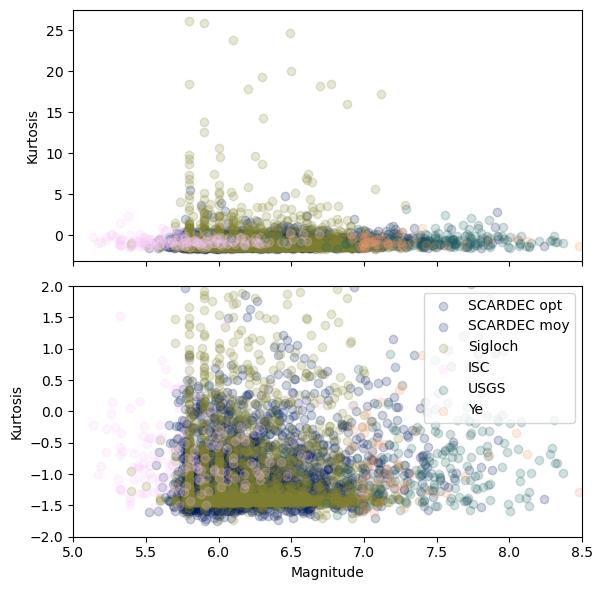

In [97]:
fig, axs = plt.subplots(2, 1, figsize = (6, 6), sharex = True)
axs[0].scatter(df_2['magnitude'], df_2['scardec_opt_kurtosis'],  alpha = 0.2, color = dataset_colors['scardec'], label = 'SCARDEC opt')
axs[0].scatter(df_2['magnitude'], df_2['scardec_moy_kurtosis'],  alpha = 0.2, color = dataset_colors['scardec'], label = 'SCARDEC moy')
axs[0].scatter(df_2['magnitude'], df_2['sigloch_0_kurtosis'],  alpha = 0.2, color = dataset_colors['sigloch'], label = 'Sigloch')
axs[0].scatter(df_2['magnitude'], df_2['isc_kurtosis'],  alpha = 0.2, color = dataset_colors['isc'], label = 'ISC')
axs[0].scatter(df_2['magnitude'], df_2['usgs_kurtosis'],  alpha = 0.2, color = dataset_colors['usgs'], label = 'USGS')
axs[0].scatter(df_2['magnitude'], df_2['ye_kurtosis'],  alpha = 0.2, color = dataset_colors['ye'], label = 'Ye')
axs[1].scatter(df_2['magnitude'], df_2['scardec_opt_kurtosis'],  alpha = 0.2, color = dataset_colors['scardec'], label = 'SCARDEC opt')
axs[1].scatter(df_2['magnitude'], df_2['scardec_moy_kurtosis'],  alpha = 0.2, color = dataset_colors['scardec'], label = 'SCARDEC moy')
axs[1].scatter(df_2['magnitude'], df_2['sigloch_0_kurtosis'],  alpha = 0.2, color = dataset_colors['sigloch'], label = 'Sigloch')
axs[1].scatter(df_2['magnitude'], df_2['isc_kurtosis'],  alpha = 0.2, color = dataset_colors['isc'], label = 'ISC')
axs[1].scatter(df_2['magnitude'], df_2['usgs_kurtosis'],  alpha = 0.2, color = dataset_colors['usgs'], label = 'USGS')
axs[1].scatter(df_2['magnitude'], df_2['ye_kurtosis'],  alpha = 0.2, color = dataset_colors['ye'], label = 'Ye')
axs[1].set_ylim(-2, 2)
axs[1].set_xlim(5, 8.5)
plt.legend()
axs[0].set_ylabel('Kurtosis')
axs[1].set_ylabel('Kurtosis')
axs[1].set_xlabel('Magnitude')
plt.tight_layout()
plt.savefig('/home/earthquakes1/homes/Rebecca/phd/stf/figures/kurtosis_vs_mag.png', dpi = 300, bbox_inches = 'tight')

In [98]:
max(df_2['scardec_opt_kurtosis'])

0.8512397800866447

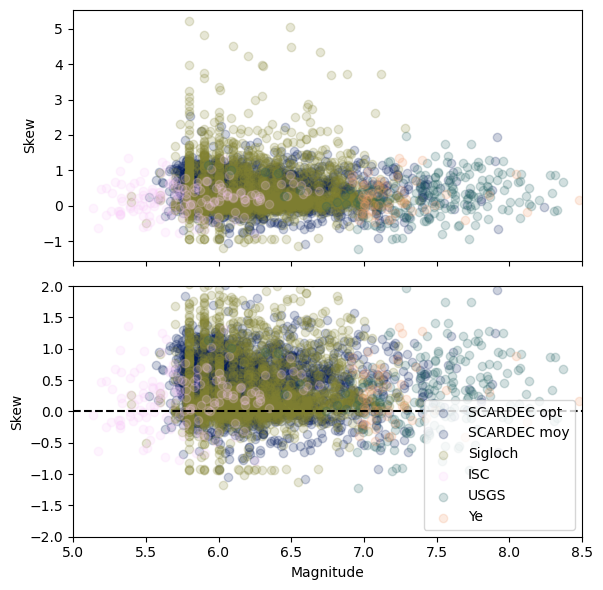

In [99]:
fig, axs = plt.subplots(2, 1, figsize = (6, 6), sharex = True)
axs[0].scatter(df_2['magnitude'], df_2['scardec_opt_skew'],  alpha = 0.2, color = dataset_colors['scardec'], label = 'SCARDEC opt')
axs[0].scatter(df_2['magnitude'], df_2['scardec_moy_skew'],  alpha = 0.2, color = dataset_colors['scardec'], label = 'SCARDEC moy')
axs[0].scatter(df_2['magnitude'], df_2['sigloch_0_skew'],  alpha = 0.2, color = dataset_colors['sigloch'], label = 'Sigloch')
axs[0].scatter(df_2['magnitude'], df_2['isc_skew'],  alpha = 0.2, color = dataset_colors['isc'], label = 'ISC')
axs[0].scatter(df_2['magnitude'], df_2['usgs_skew'],  alpha = 0.2, color = dataset_colors['usgs'], label = 'USGS')
axs[0].scatter(df_2['magnitude'], df_2['ye_skew'],  alpha = 0.2, color = dataset_colors['ye'], label = 'Ye')
axs[1].scatter(df_2['magnitude'], df_2['scardec_opt_skew'],  alpha = 0.2, color = dataset_colors['scardec'], label = 'SCARDEC opt')
axs[1].scatter(df_2['magnitude'], df_2['scardec_moy_skew'],  alpha = 0.2, color = dataset_colors['scardec'], label = 'SCARDEC moy')
axs[1].scatter(df_2['magnitude'], df_2['sigloch_0_skew'],  alpha = 0.2, color = dataset_colors['sigloch'], label = 'Sigloch')
axs[1].scatter(df_2['magnitude'], df_2['isc_skew'],  alpha = 0.2, color = dataset_colors['isc'], label = 'ISC')
axs[1].scatter(df_2['magnitude'], df_2['usgs_skew'],  alpha = 0.2, color = dataset_colors['usgs'], label = 'USGS')
axs[1].scatter(df_2['magnitude'], df_2['ye_skew'],  alpha = 0.2, color = dataset_colors['ye'], label = 'Ye')
axs[1].set_ylim(-2, 2)
axs[1].plot([5, 8.5], [0, 0], 'k--')
axs[1].set_xlim(5, 8.5)
plt.legend()
axs[0].set_ylabel('Skew')
axs[1].set_ylabel('Skew')
axs[1].set_xlabel('Magnitude')
plt.tight_layout()
plt.savefig('/home/earthquakes1/homes/Rebecca/phd/stf/figures/skew_vs_mag.png', dpi = 300, bbox_inches = 'tight')

In [100]:
def myround(x, base=1):
    return base * round(x/base)

In [101]:
catalog = pd.read_csv('/home/earthquakes1/homes/Rebecca/phd/stf/data/combined_m55_catalog.csv', sep = '|')

In [102]:
cols = catalog.columns
column_names = []
for c in cols:
    column_names.append(c.strip().rstrip().lower())
column_names[0] = 'catalog_id'
catalog.columns = column_names

In [103]:
catalog['year'] = catalog.apply(lambda x: x['time'][:4], axis = 1)
catalog['month'] = catalog.apply(lambda x: x['time'][5:7], axis = 1)
catalog['day'] = catalog.apply(lambda x: x['time'][8:10], axis = 1)
catalog['hour'] = catalog.apply(lambda x: x['time'][11:13], axis = 1)
catalog['minute'] = catalog.apply(lambda x: x['time'][14:16], axis = 1)

catalog['event'] = catalog.apply(lambda x: x['year'] + x['month'] + x['day'] + '_' + x['hour'] + x['minute'], axis = 1)

catalog['int_magnitude'] = catalog.apply(lambda x: myround(x['magnitude']), axis = 1)

In [104]:
catalog.drop(columns = ['contributor', 'contributorid', 'magauthor', 'eventlocationname', 'author', 'catalog', 'time'], inplace = True)

In [105]:
catalog = catalog[['event', 'catalog_id', 'year', 'month', 'day', 'hour', 'minute', 'latitude', 'longitude', 'depth/km', 'magnitude', 'int_magnitude', 'magtype']]

In [106]:
catalog

,event,catalog_id,year,month,day,hour,minute,latitude,longitude,depth/km,magnitude,int_magnitude,magtype
0,20250121_1115,11926233,2025,01,21,11,15,-3.7368,151.5823,10.000,5.5,6,Mww
1,20250121_0605,11926190,2025,01,21,06,05,-27.4829,-13.4632,10.000,5.5,6,mb
2,20250121_0547,11926184,2025,01,21,05,47,13.4344,144.3969,137.242,5.5,6,mww
3,20250120_1617,11926033,2025,01,20,16,17,23.2338,120.4749,10.000,6.0,6,mww
4,20250120_0838,11925968,2025,01,20,08,38,-11.3327,165.8206,35.000,5.6,6,mww
...,...,...,...,...,...,...,...,...,...,...,...,...,...
16101,19900108_1944,2808110,1990,01,08,19,44,52.0105,-169.6001,15.000,5.6,6,mb
16102,19900107_0906,2808066,1990,01,07,09,06,-15.9527,-74.2840,48.900,5.9,6,mb
16103,19900106_2144,2808053,1990,01,06,21,44,-10.6437,92.9744,15.000,5.9,6,mw
16104,19900104_0532,2807962,1990,01,04,05,32,-15.4219,-172.9087,42.600,6.4,6,mb


In [107]:
# Convert 'event' column to string type in both dataframes
df['event'] = df['event'].astype(str)
catalog['event'] = catalog['event'].astype(str)

# Merge the dataframes on the 'event' column
df_3 = df.merge(catalog[['event', 'magnitude', 'depth/km']], on='event', how='left')

# Rename the 'mag' column to 'magnitude' in the merged dataframe
df_3.rename(columns={'mag': 'magnitude'}, inplace=True)

df_3

,event,scardec_opt_kurtosis,scardec_opt_skew,scardec_moy_kurtosis,scardec_moy_skew,ye_kurtosis,ye_skew,usgs_kurtosis,usgs_skew,sigloch_0_kurtosis,sigloch_0_skew,sigloch_1_kurtosis,sigloch_1_skew,isc_kurtosis,isc_skew,magnitude,depth/km
0,20170818_0259,0.85124,1.374887,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.6,10.00
1,20170818_0259,NaN,NaN,-0.126631,1.087344,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.6,10.00
2,19981010_1629,NaN,NaN,-1.125966,-0.374096,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.8,45.60
3,19920730_0824,NaN,NaN,-1.357865,0.393852,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.1,31.40
4,19960327_2052,NaN,NaN,-1.160279,0.213813,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,45.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5256,20150810_0424,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.103780,2.605918,NaN,NaN,NaN,NaN,5.9,27.00
5257,20040716_2358,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.716736,1.702009,NaN,NaN,NaN,NaN,6.1,10.00
5258,20160812_0329,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.718934,2.161310,NaN,NaN,NaN,NaN,6.2,114.09
5259,20090104_0714,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.431333,0.074178,NaN,NaN,NaN,NaN,5.5,33.70


In [108]:
import scipy.stats as stats

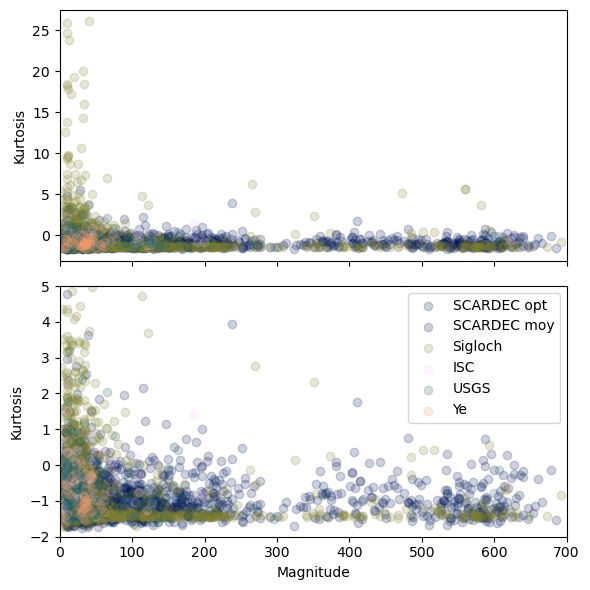

In [109]:
fig, axs = plt.subplots(2, 1, figsize = (6, 6), sharex = True)
axs[0].scatter(df_3['depth/km'], df_3['scardec_opt_kurtosis'],  alpha = 0.2, color = dataset_colors['scardec'], label = 'SCARDEC opt')
axs[0].scatter(df_3['depth/km'], df_3['scardec_moy_kurtosis'],  alpha = 0.2, color = dataset_colors['scardec'], label = 'SCARDEC moy')
axs[0].scatter(df_3['depth/km'], df_3['sigloch_0_kurtosis'],  alpha = 0.2, color = dataset_colors['sigloch'], label = 'Sigloch')
axs[0].scatter(df_3['depth/km'], df_3['isc_kurtosis'],  alpha = 0.2, color = dataset_colors['isc'], label = 'ISC')
axs[0].scatter(df_3['depth/km'], df_3['usgs_kurtosis'],  alpha = 0.2, color = dataset_colors['usgs'], label = 'USGS')
axs[0].scatter(df_3['depth/km'], df_3['ye_kurtosis'],  alpha = 0.2, color = dataset_colors['ye'], label = 'Ye')
axs[1].scatter(df_3['depth/km'], df_3['scardec_opt_kurtosis'],  alpha = 0.2, color = dataset_colors['scardec'], label = 'SCARDEC opt')
axs[1].scatter(df_3['depth/km'], df_3['scardec_moy_kurtosis'],  alpha = 0.2, color = dataset_colors['scardec'], label = 'SCARDEC moy')
axs[1].scatter(df_3['depth/km'], df_3['sigloch_0_kurtosis'],  alpha = 0.2, color = dataset_colors['sigloch'], label = 'Sigloch')
axs[1].scatter(df_3['depth/km'], df_3['isc_kurtosis'],  alpha = 0.2, color = dataset_colors['isc'], label = 'ISC')
axs[1].scatter(df_3['depth/km'], df_3['usgs_kurtosis'],  alpha = 0.2, color = dataset_colors['usgs'], label = 'USGS')
axs[1].scatter(df_3['depth/km'], df_3['ye_kurtosis'],  alpha = 0.2, color = dataset_colors['ye'], label = 'Ye')
axs[1].set_ylim(-2, 5)
axs[1].set_xlim(0, 700)
plt.legend()
axs[0].set_ylabel('Kurtosis')
axs[1].set_ylabel('Kurtosis')
axs[1].set_xlabel('Magnitude')
plt.tight_layout()
plt.savefig('/home/earthquakes1/homes/Rebecca/phd/stf/figures/kurtosis_vs_depth.png', dpi = 300, bbox_inches = 'tight')

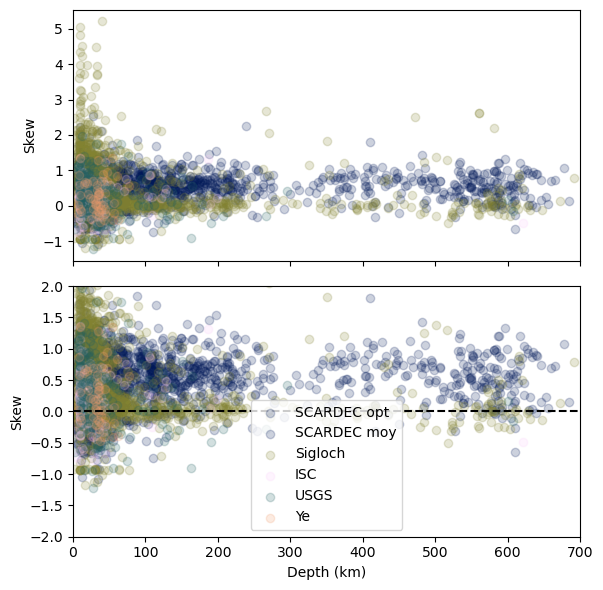

In [110]:
fig, axs = plt.subplots(2, 1, figsize = (6, 6), sharex = True)
axs[0].scatter(df_3['depth/km'], df_3['scardec_opt_skew'],  alpha = 0.2, color = dataset_colors['scardec'], label = 'SCARDEC opt')
axs[0].scatter(df_3['depth/km'], df_3['scardec_moy_skew'],  alpha = 0.2, color = dataset_colors['scardec'], label = 'SCARDEC moy')
axs[0].scatter(df_3['depth/km'], df_3['sigloch_0_skew'],  alpha = 0.2, color = dataset_colors['sigloch'], label = 'Sigloch')
axs[0].scatter(df_3['depth/km'], df_3['isc_skew'],  alpha = 0.2, color = dataset_colors['isc'], label = 'ISC')
axs[0].scatter(df_3['depth/km'], df_3['usgs_skew'],  alpha = 0.2, color = dataset_colors['usgs'], label = 'USGS')
axs[0].scatter(df_3['depth/km'], df_3['ye_skew'],  alpha = 0.2, color = dataset_colors['ye'], label = 'Ye')
axs[1].scatter(df_3['depth/km'], df_3['scardec_opt_skew'],  alpha = 0.2, color = dataset_colors['scardec'], label = 'SCARDEC opt')
axs[1].scatter(df_3['depth/km'], df_3['scardec_moy_skew'],  alpha = 0.2, color = dataset_colors['scardec'], label = 'SCARDEC moy')
axs[1].scatter(df_3['depth/km'], df_3['sigloch_0_skew'],  alpha = 0.2, color = dataset_colors['sigloch'], label = 'Sigloch')
axs[1].scatter(df_3['depth/km'], df_3['isc_skew'],  alpha = 0.2, color = dataset_colors['isc'], label = 'ISC')
axs[1].scatter(df_3['depth/km'], df_3['usgs_skew'],  alpha = 0.2, color = dataset_colors['usgs'], label = 'USGS')
axs[1].scatter(df_3['depth/km'], df_3['ye_skew'],  alpha = 0.2, color = dataset_colors['ye'], label = 'Ye')
axs[1].set_ylim(-2, 2)
axs[1].plot([0, 700], [0, 0], 'k--')
axs[1].set_xlim(0, 700)
plt.legend()
axs[0].set_ylabel('Skew')
axs[1].set_ylabel('Skew')
axs[1].set_xlabel('Depth (km)')
plt.tight_layout()
plt.savefig('/home/earthquakes1/homes/Rebecca/phd/stf/figures/skew_vs_depth.png', dpi = 300, bbox_inches = 'tight')

/tmp/ipykernel_1185772/2105111407.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='dataset', y='skew', data=df_violin, palette=dataset_colors, alpha = 0.7)


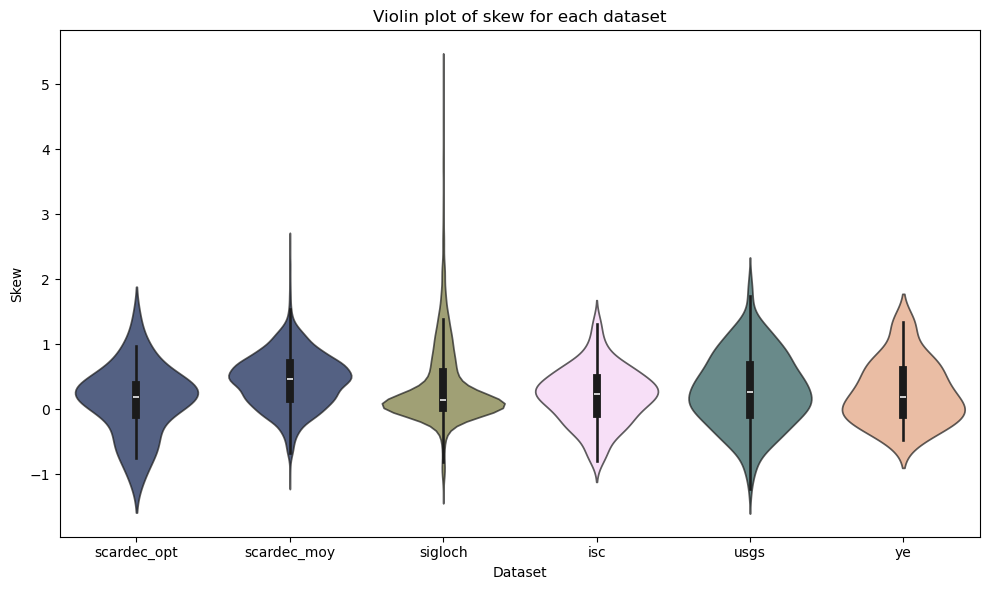

In [114]:
# Add 'scardec_opt' to dataset_colors
dataset_colors['scardec_opt'] = dataset_colors['scardec']
dataset_colors['scardec_moy'] = dataset_colors['scardec']

# Create a new dataframe for the violin plot
df_violin = pd.DataFrame({
	'skew': np.concatenate([
		df_3['scardec_opt_skew'].dropna().values,
		df_3['scardec_moy_skew'].dropna().values,
		df_3['sigloch_0_skew'].dropna().values,
		df_3['isc_skew'].dropna().values,
		df_3['usgs_skew'].dropna().values,
		df_3['ye_skew'].dropna().values
	]),
	'dataset': ['scardec_opt'] * df_3['scardec_opt_skew'].dropna().shape[0] +
			   ['scardec_moy'] * df_3['scardec_moy_skew'].dropna().shape[0] +
			   ['sigloch'] * df_3['sigloch_0_skew'].dropna().shape[0] +
			   ['isc'] * df_3['isc_skew'].dropna().shape[0] +
			   ['usgs'] * df_3['usgs_skew'].dropna().shape[0] +
			   ['ye'] * df_3['ye_skew'].dropna().shape[0]
})

# Plot the violin plot
plt.figure(figsize=(10, 6))
sns.violinplot(x='dataset', y='skew', data=df_violin, palette=dataset_colors, alpha = 0.7)
plt.title('Violin plot of skew for each dataset')
plt.xlabel('Dataset')
plt.ylabel('Skew')
plt.tight_layout()
plt.savefig('/home/earthquakes1/homes/Rebecca/phd/stf/figures/violinplot_skew.png', dpi=300, bbox_inches='tight')
plt.show()

/tmp/ipykernel_1185772/4045572020.py:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='dataset', y='kurtosis', data=df_violin, palette=dataset_colors, alpha = 0.7)


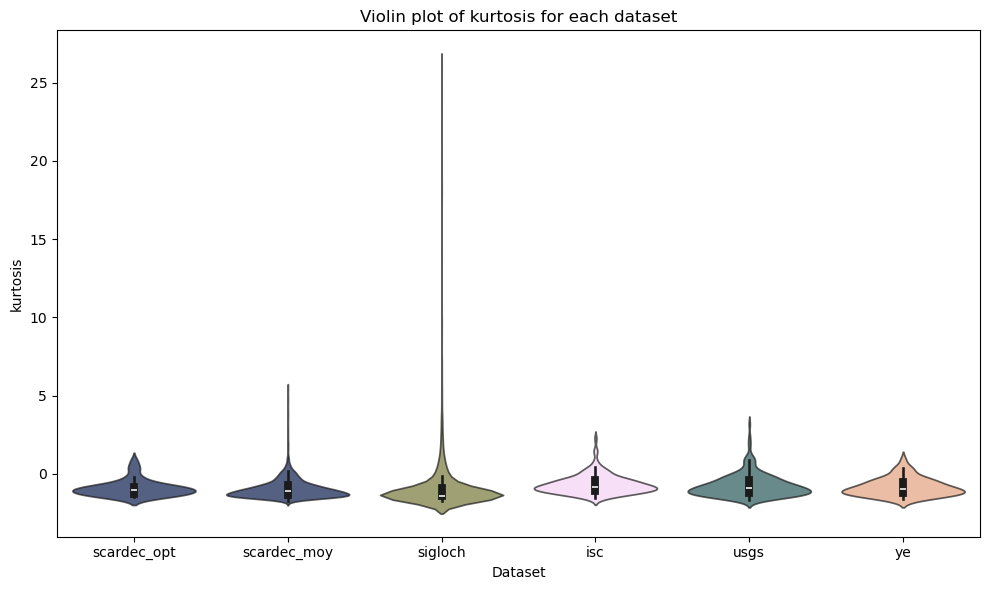

In [115]:
# Add 'scardec_opt' to dataset_colors
dataset_colors['scardec_opt'] = dataset_colors['scardec']
dataset_colors['scardec_moy'] = dataset_colors['scardec']

# Create a new dataframe for the violin plot
df_violin = pd.DataFrame({
	'kurtosis': np.concatenate([
		df_3['scardec_opt_kurtosis'].dropna().values,
		df_3['scardec_moy_kurtosis'].dropna().values,
		df_3['sigloch_0_kurtosis'].dropna().values,
		df_3['isc_kurtosis'].dropna().values,
		df_3['usgs_kurtosis'].dropna().values,
		df_3['ye_kurtosis'].dropna().values
	]),
	'dataset': ['scardec_opt'] * df_3['scardec_opt_kurtosis'].dropna().shape[0] +
			   ['scardec_moy'] * df_3['scardec_moy_kurtosis'].dropna().shape[0] +
			   ['sigloch'] * df_3['sigloch_0_kurtosis'].dropna().shape[0] +
			   ['isc'] * df_3['isc_kurtosis'].dropna().shape[0] +
			   ['usgs'] * df_3['usgs_kurtosis'].dropna().shape[0] +
			   ['ye'] * df_3['ye_kurtosis'].dropna().shape[0]
})

# Plot the violin plot
plt.figure(figsize=(10, 6))
sns.violinplot(x='dataset', y='kurtosis', data=df_violin, palette=dataset_colors, alpha = 0.7)
plt.title('Violin plot of kurtosis for each dataset')
plt.xlabel('Dataset')
plt.ylabel('kurtosis')

plt.tight_layout()
plt.savefig('/home/earthquakes1/homes/Rebecca/phd/stf/figures/violinplot_kurtosis.png', dpi=300, bbox_inches='tight')
plt.show()

In [134]:
df_violin

,kurtosis,dataset
0,0.851212,scardec_opt
1,-1.024287,scardec_opt
2,-0.872434,scardec_opt
3,-1.355184,scardec_opt
4,-0.161880,scardec_opt
...,...,...
8642,-1.058939,ye
8643,-1.211425,ye
8644,-0.028164,ye
8645,0.906863,ye
